In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import scipy as sp
from PIL import Image
import random

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
%matplotlib inline

from __future__ import print_function

import time
import numpy as np
from PIL import Image as pil_image
from keras.preprocessing.image import save_img
from keras import layers
from keras.layers import Dropout, Dense
from keras.models import Model
from keras.applications import MobileNet
from keras import backend as K

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

Using TensorFlow backend.


['mob30accyummly', 'yummly27k-flavours-classification']


In [2]:
# read metadata

df_meta = pd.read_csv('../input/yummly27k-flavours-classification/metadata27368.csv')
#df_meta.head()

In [3]:
# import flavours

df_flav = pd.read_csv('../input/yummly27k-flavours-classification/flavours.csv')
print(df_flav.columns)
flav = df_flav.values
print(flav)

Index(['Meaty', 'Sweet', 'Piquant', 'Sour', 'Salty', 'Bitter'], dtype='object')
[[   nan    nan    nan    nan    nan    nan]
 [0.8333 0.3333 0.5    0.5    0.8333 0.8333]
 [0.5    0.3333 0.     0.8333 0.3333 1.    ]
 ...
 [0.6667 0.6667 0.     0.     1.     0.6667]
 [0.5    0.8333 0.5    0.5    0.6667 1.    ]
 [   nan    nan    nan    nan    nan    nan]]


In [4]:
# import faulty images indexes

file = open("../input/yummly27k-flavours-classification/faulty_images.txt", "r")
faul_id = []
for val in file.read().split():
    faul_id.append(int(val)-1)
file.close()
print(len(faul_id),"faulty images")

262 faulty images


In [5]:
# get the unlabeled images indexes

# search for nan values in flavours df
nan_bool = df_flav.isnull().any(axis=1)
nan_id = np.where(nan_bool == True)[0]
print(len(nan_id),'unlabeled images')

4886 unlabeled images


In [6]:
# remove faulty images from unlabeles

f_nan_id = []
for i in faul_id:
    t = np.where(nan_id == i)[0]
    if len(t) != 0:
        f_nan_id.append(t)
nan_id = np.delete(nan_id, f_nan_id)

print(len(nan_id),'true unlabeled images')

4827 true unlabeled images


In [7]:
# Good images !

good_id = np.arange(27638)
good_id = np.delete(good_id, np.union1d(faul_id, nan_id))

print(len(good_id))

22549


In [8]:
# Train and validation split 
train_id, val_id, _, _ = train_test_split(good_id, good_id, test_size=0.2)

print('Train', len(train_id))
print('Val',len(val_id))

Train 18039
Val 4510


In [9]:
# creat a useful dictionary structures

partition = {}
partition['train'] = train_id
partition['validation'] = val_id
partition['faulty'] = faul_id
partition['no_label'] = nan_id

labels = {}
name = {}
image = {}
for i in range(27638):
    
    labels[str(i)] = df_flav.iloc[[i]].values[0] # every label is a panda df rows
    
    name[str(i)] = df_meta['name'][i]
    
    im = str(i+1)
    while len(im) < 5 :
        im = '0' + im
    im ='img' + im + '.jpg'
    image[str(i)] = im

In [10]:
mob = MobileNet(weights='imagenet', input_shape=(224,224,3))
print('Model loaded.')
mob.summary()

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
17227776/17225924 [==============================] - 1s 0us/step
Model loaded.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
________

In [11]:
# CREATE THE MODEL ARCHITECTURE

# Exclude the last 5 layers of the above model.
# This will include all layers up to and including global_average_pooling2d_1
x = mob.layers[-6].output

# Create a new dense layer for predictions
# 7 corresponds to the number of classes
x = Dropout(0.25)(x)
predictions = Dense(6, activation='softmax')(x)

# inputs=mobile.input selects the input layer, outputs=predictions refers to the
# dense layer we created above.

mobileNet = Model(inputs=mob.input, outputs=predictions)

In [12]:
mobileNet.load_weights('../input/mob30accyummly/Mob_30acc_model.h5')

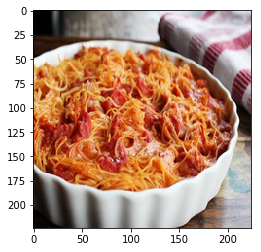

In [13]:
im = Image.open("../input/yummly27k-flavours-classification/images27638/images27638/img01993.jpg")
im = im.resize((224, 224), Image.ANTIALIAS)
im.load()
            
X = np.asarray(im, dtype=np.uint8 )

plt.imshow(X)
plt.show()

In [14]:
layer_outputs = [layer.output for layer in mobileNet.layers]
layer_outputs = layer_outputs[1:]
activation_model = Model(inputs=mobileNet.input, outputs=layer_outputs)
activations = activation_model.predict(np.expand_dims(X,axis=0))

def display_activation_accurate(activations, layer_index, filter_id): 
    activation = activations[layer_index]
    output = activation[0,:,:,filter_id]
    plt.imshow(output)
    plt.show()
 

def display_activation(activations, col_size, row_size, act_index): 
    activation = activations[act_index]
    activation_index=0
    fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*2.5,col_size*1.5))
    for row in range(0,row_size):
        for col in range(0,col_size):
            ax[row][col].imshow(activation[0, :, :, activation_index])
            activation_index += 1
            
def activation_accurate(activations, layer_index, filter_id): 
    activation = activations[layer_index]
    output = activation[0,:,:,filter_id]
    return output
 

In [15]:
for i, layer in enumerate(mobileNet.layers):
    print(i - 1, layer.name, layer.output)
    print('-'*80)

-1 input_1 Tensor("input_1:0", shape=(?, 224, 224, 3), dtype=float32)
--------------------------------------------------------------------------------
0 conv1_pad Tensor("conv1_pad/Pad:0", shape=(?, 225, 225, 3), dtype=float32)
--------------------------------------------------------------------------------
1 conv1 Tensor("conv1/convolution:0", shape=(?, 112, 112, 32), dtype=float32)
--------------------------------------------------------------------------------
2 conv1_bn Tensor("conv1_bn/cond/Merge:0", shape=(?, 112, 112, 32), dtype=float32)
--------------------------------------------------------------------------------
3 conv1_relu Tensor("conv1_relu/Relu6:0", shape=(?, 112, 112, 32), dtype=float32)
--------------------------------------------------------------------------------
4 conv_dw_1 Tensor("conv_dw_1/depthwise:0", shape=(?, 112, 112, 32), dtype=float32)
--------------------------------------------------------------------------------
5 conv_dw_1_bn Tensor("conv_dw_1_bn/cond

# first convolutional layer

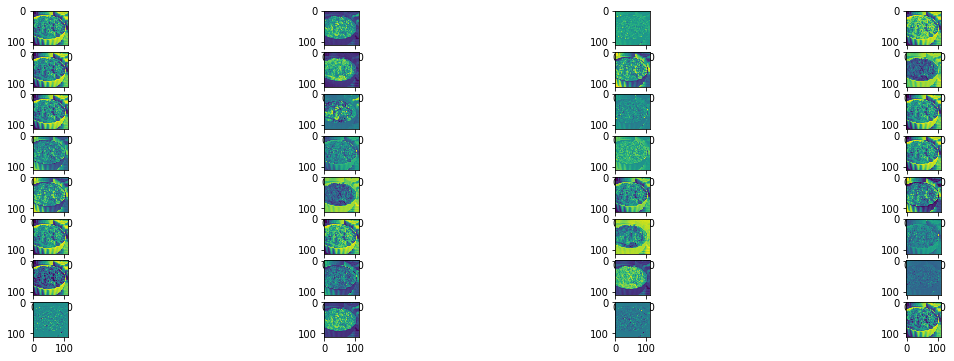

In [16]:
display_activation(activations, 4, 8, 1)

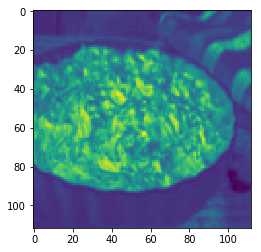

In [17]:
display_activation_accurate(activations, 1, 1)

# 2nd conv layer

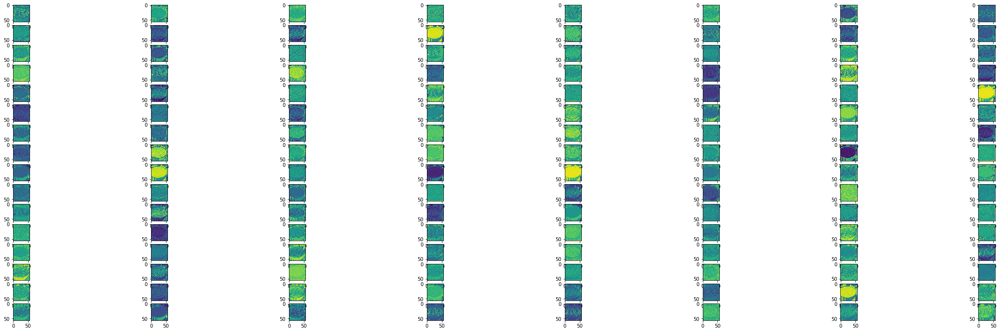

In [18]:
display_activation(activations, 8, 16, 14)

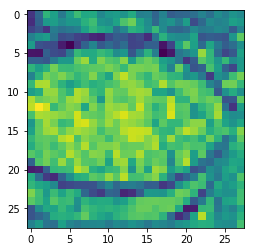

In [19]:
display_activation_accurate(activations, 27, 17)

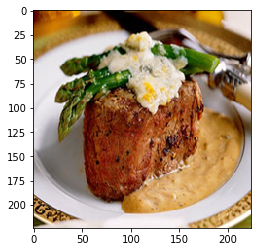

In [20]:
im = Image.open("../input/yummly27k-flavours-classification/images27638/images27638/img01923.jpg")
im = im.resize((224, 224), Image.ANTIALIAS)
im.load()
            
X = np.asarray(im, dtype=np.uint8 )

plt.imshow(X)
plt.show()

In [21]:
activations = activation_model.predict(np.expand_dims(X,axis=0))


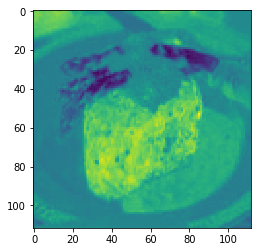

In [22]:
display_activation_accurate(activations, 1, 1)

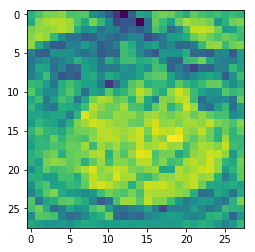

In [23]:
display_activation_accurate(activations, 27, 17)

# Test on multiple images

In [24]:


def plot_pie_chart(model, img, labels = ['Bitter', 'Meaty', 'Piquant', 'Salty', 'Sour', 'Sweet']):
    #fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))

    recipe = labels

    data = model.predict(img)[0]

    wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), startangle=-40)

    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    kw = dict(xycoords='data', textcoords='data', arrowprops=dict(arrowstyle="-"),
              bbox=bbox_props, zorder=0, va="center")

    for i, p in enumerate(wedges):
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = "angle,angleA=0,angleB={}".format(ang)
        kw["arrowprops"].update({"connectionstyle": connectionstyle})
        ax.annotate(recipe[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                     horizontalalignment=horizontalalignment, **kw)

    ax.set_title("What AI sees")

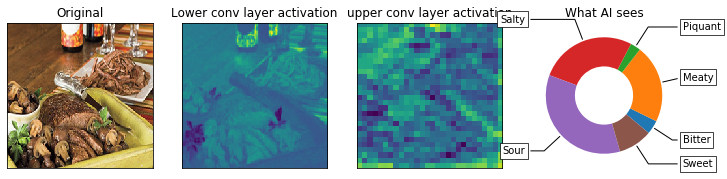

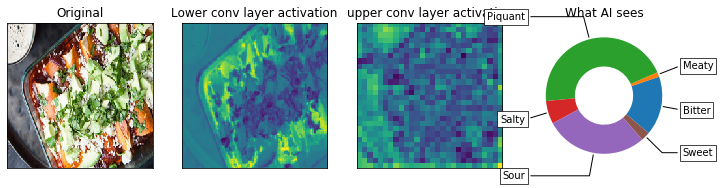

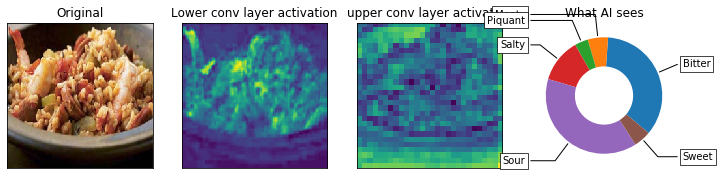

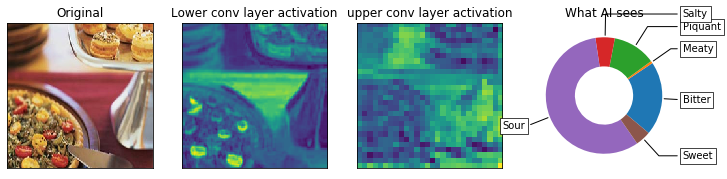

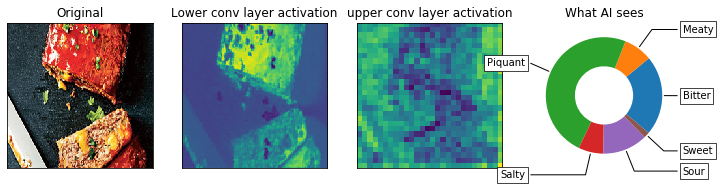

...

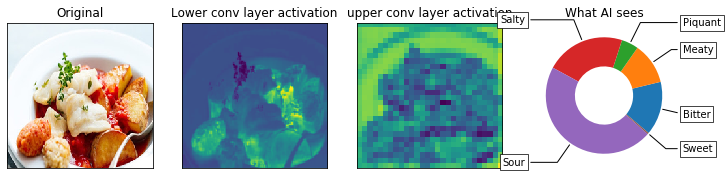

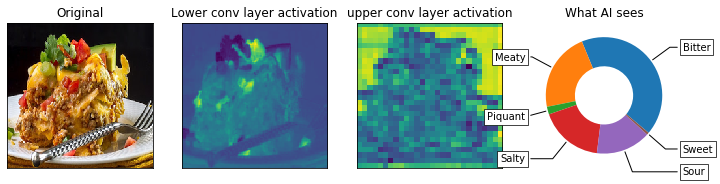

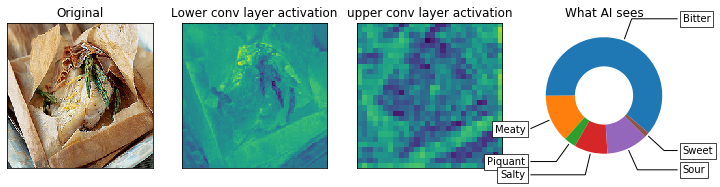

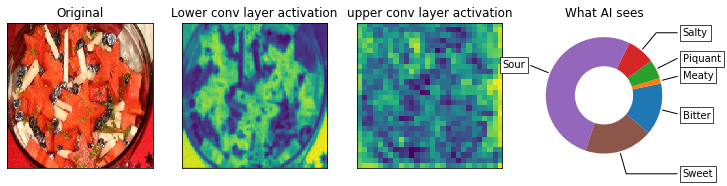

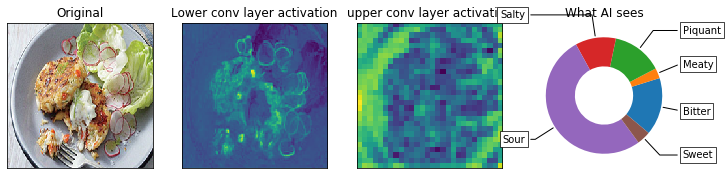

In [25]:
num_images = 50
np.random.seed(42)
random_images = random.sample(list(val_id),num_images)

layer_outputs = [layer.output for layer in mobileNet.layers]
layer_outputs = layer_outputs[1:]
activation_model = Model(inputs=mobileNet.input, outputs=layer_outputs)

lower_layer = [1, 1]
upper_layer = [27, 17]


for i, img_id in enumerate(random_images):
    
    plt.figure(figsize=(12,12))
    
    #Load in example image
    im = Image.open("../input/yummly27k-flavours-classification/images27638/images27638/"+image[str(img_id)])
    im = im.resize((224, 224), Image.ANTIALIAS)
    im.load()
    im = np.asarray(im, dtype=np.uint8)/255
    
    activations = activation_model.predict(np.expand_dims(im,axis=0))

    #Plot original image
    ax = plt.subplot(1, 4, 1)
    plt.imshow(im)
    plt.title('Original')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    #Plot lower layer activation
    low_lay = activation_accurate(activations, lower_layer[0], lower_layer[1])
    ax = plt.subplot(1, 4, 2)
    plt.imshow(low_lay)
    plt.title('Lower conv layer activation')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    
    
    #Plot upper layer activation
    upp_lay = activation_accurate(activations, upper_layer[0], upper_layer[1])
    ax = plt.subplot(1, 4, 3)
    plt.imshow(upp_lay)
    plt.title('upper conv layer activation')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    #Plot decoded image ("what the AE reconstructed")
    ax = plt.subplot(1, 4, 4)
    plot_pie_chart(mobileNet, np.expand_dims(im,axis=0))
    plt.show()

In [26]:
def Cam_TopClass(model, image, classes = ['Bitter', 'Meaty', 'Piquant', 'Salty', 'Sour', 'Sweet']):
    test_img = image


    # get the weights from the last layer
    gap_weights = mobileNet.layers[-1].get_weights()[0]

    # create a new model to output the feature maps and the predicted labels
    cam_model = Model(inputs=mobileNet.input, 
                    outputs=(mobileNet.layers[-4].output, mobileNet.layers[-1].output)) 

    # make the prediction for a set of test images
    features, results = cam_model.predict(np.expand_dims(test_img,axis=0))
   
    # get the feature map of the test image
    features_for_one_img = features[0, :, :, :]

    # map the feature map to the original size
    height_roomout = 224 / features_for_one_img.shape[0]
    width_roomout = 224 / features_for_one_img.shape[1]
    cam_features = sp.ndimage.zoom(features_for_one_img, (height_roomout, width_roomout, 1), order=2)
        
    # get the predicted label with the maximum probability
    pred = np.argmax(results)
    
    # prepare the final display
    #plt.figure(facecolor='white')
    
    # get the weights of class activation map
    cam_weights = gap_weights[:, pred]

    # create the class activation map
    cam_output = np.dot(cam_features, cam_weights)
    
    # draw the class activation map
    #ax.set_xticklabels([])
    #ax.set_yticklabels([])
    
    buf = 'Cam for ' + classes[pred] + ', ' + str(results[0][pred])
    plt.title(buf)
    plt.imshow(test_img, alpha=0.5)
    plt.imshow(cam_output, cmap='jet', alpha=0.5)
  

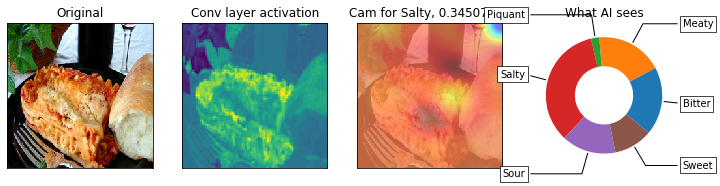

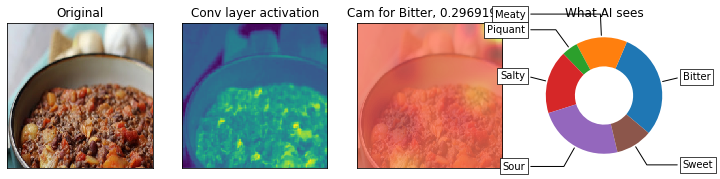

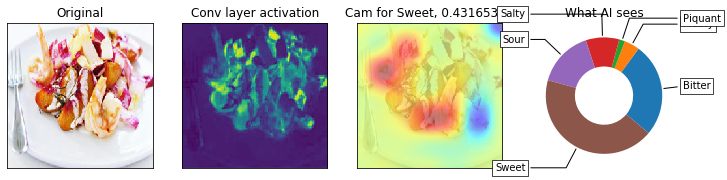

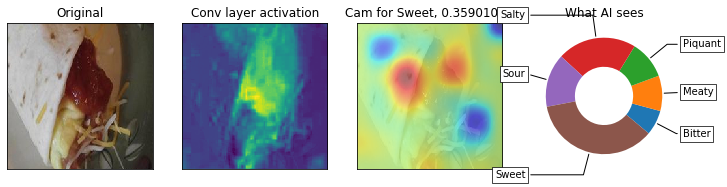

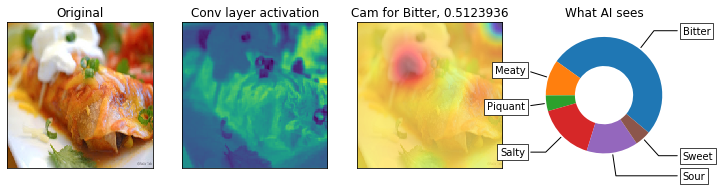

...

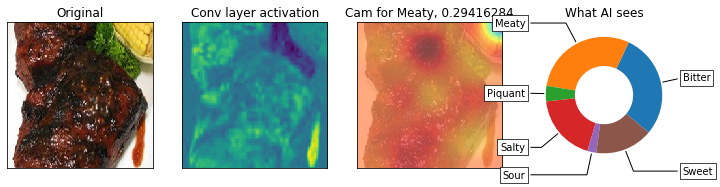

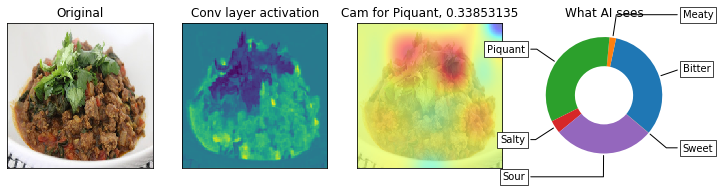

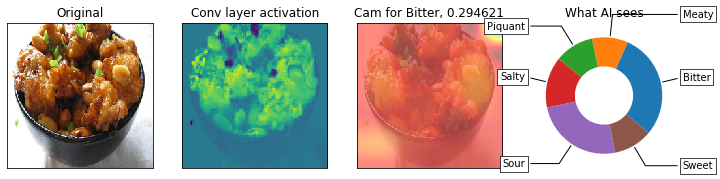

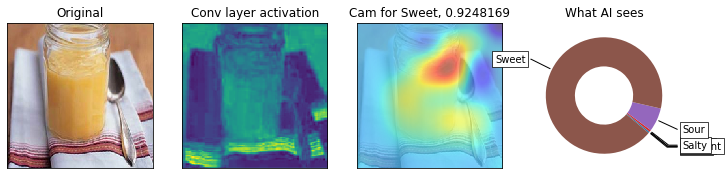

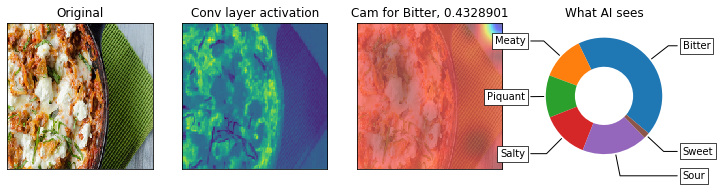

In [27]:
num_images = 50
np.random.seed(42)
random_images = random.sample(list(val_id),num_images)

layer_outputs = [layer.output for layer in mobileNet.layers]
layer_outputs = layer_outputs[1:]
activation_model = Model(inputs=mobileNet.input, outputs=layer_outputs)

lower_layer = [1, 1]
upper_layer = [27, 17]


for i, img_id in enumerate(random_images):
    
    plt.figure(figsize=(12,12))
    
    #Load in example image
    im = Image.open("../input/yummly27k-flavours-classification/images27638/images27638/"+image[str(img_id)])
    im = im.resize((224, 224), Image.ANTIALIAS)
    im.load()
    im = np.asarray(im, dtype=np.uint8)/255
    
    activations = activation_model.predict(np.expand_dims(im,axis=0))

    #Plot original image
    ax = plt.subplot(1, 4, 1)
    plt.imshow(im)
    plt.title('Original')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    #Plot Conv layer activation
    low_lay = activation_accurate(activations, lower_layer[0], lower_layer[1])
    ax = plt.subplot(1, 4, 2)
    plt.imshow(low_lay)
    plt.title('Conv layer activation')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    
    
    #Plot top Class Activation Map
    ax = plt.subplot(1, 4, 3)
    Cam_TopClass(mobileNet, im)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    #Plot decoded image ("what the AE reconstructed")
    ax = plt.subplot(1, 4, 4)
    plot_pie_chart(mobileNet, np.expand_dims(im,axis=0))
    plt.tight_layout
    plt.show()

In [28]:
def Cam_AllClass(model, image, classes = ['Bitter', 'Meaty', 'Piquant', 'Salty', 'Sour', 'Sweet']):
    test_img = image


    # get the weights from the last layer
    gap_weights = mobileNet.layers[-1].get_weights()[0]

    # create a new model to output the feature maps and the predicted labels
    cam_model = Model(inputs=mobileNet.input, 
                    outputs=(mobileNet.layers[-4].output, mobileNet.layers[-1].output)) 

    # make the prediction for a set of test images
    features, results = cam_model.predict(np.expand_dims(test_img,axis=0))
   
    # get the feature map of the test image
    features_for_one_img = features[0, :, :, :]

    # map the feature map to the original size
    height_roomout = 224 / features_for_one_img.shape[0]
    width_roomout = 224 / features_for_one_img.shape[1]
    cam_features = sp.ndimage.zoom(features_for_one_img, (height_roomout, width_roomout, 1), order=2)
    
    
    
    for label in classes:
        
        label_idx = classes.index(label)
        
        # get the predicted label with the maximum probability
        #pred = np.argmax(results)
    
    
        # get the weights of class activation map
        cam_weights = gap_weights[:, label_idx]

        # create the class activation map
        cam_output = np.dot(cam_features, cam_weights)
    
    # draw the class activation map
    #ax.set_xticklabels([])
    #ax.set_yticklabels([])
    
        ax = plt.figure
    
        buf = 'Cam for ' + classes[label_idx] + ', ' + str(results[0][label_idx])
        plt.title(buf)
        plt.imshow(test_img, alpha=0.5)
        plt.imshow(cam_output, cmap='jet', alpha=0.5)
        plt.show()
  

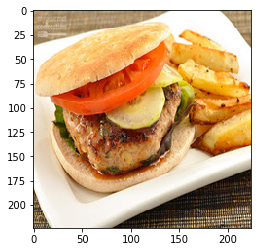

In [29]:
im = Image.open("../input/yummly27k-flavours-classification/images27638/images27638/img03213.jpg")
im = im.resize((224, 224), Image.ANTIALIAS)
im.load()
            
X = np.asarray(im, dtype=np.uint8 )

plt.imshow(X)
plt.show()

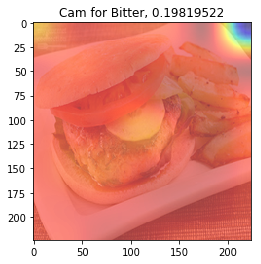

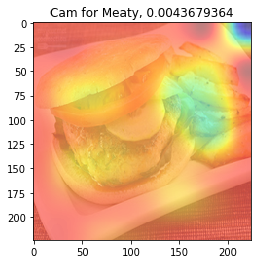

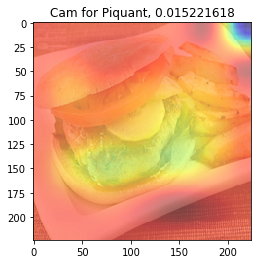

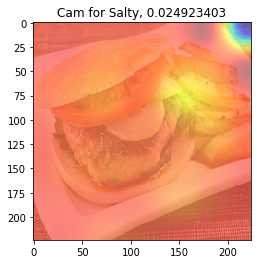

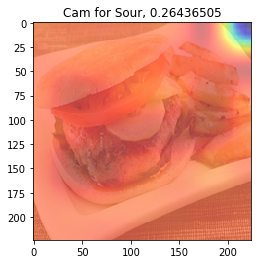

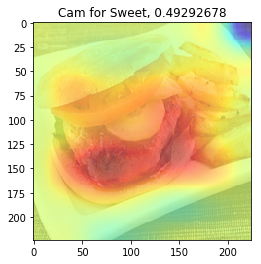

In [30]:
Cam_AllClass(mobileNet, X)